# Exploratory Analysis of Water Quality Data I - Continuous Data

# Temporal Patterns

This document includes Python code and results of the exploratory analysis of water quality data in the SEACAR Pilot project.

In [1]:
import matplotlib.pyplot as plt
import numpy      as np
import pandas     as pd
import geopandas  as gpd
import contextily as cx
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from matplotlib.dates import (YEARLY, MONTHLY, DateFormatter,rrulewrapper, RRuleLocator, drange)

## 1. Data loading and preprocessing
Read the csv file of data.

In [2]:
df      = pd.read_csv(r"D:\Water Quailty/OEAT_Continuous-2022-Nov-04.csv")
areaShp = gpd.read_file(r"D:\Water Quailty\ManagedAreas/ORCP_Managed_Areas_Oct2021.shp")

Select five managed areas and six parameters. Select only columns that are needed for the analysis. Convert the SampleDate from string to datetime object.

In [3]:
df2 = df.loc[df["ManagedAreaName"].isin(["Guana Tolomato Matanzas National Estuarine Research Reserve",
                            "Biscayne Bay Aquatic Preserve",
                            "Estero Bay Aquatic Preserve",
                            "Gasparilla Sound-Charlotte Harbor Aquatic Preserve",
                            "Big Bend Seagrasses Aquatic Preserve"])]
df2 = df2[['RowID','ParameterName','ParameterUnits','ProgramLocationID','ActivityType','ManagedAreaName',
           'SampleDate','Year','Month','ResultValue','ValueQualifier','Latitude_DD','Longitude_DD']]
df2 = df2.loc[df2["ParameterName"].isin(["Salinity","Total Nitrogen","Dissolved Oxygen","Turbidity","Secchi Depth","Water Temperature"])]
df2["timestamp"]=  pd.to_datetime(df2['SampleDate'])

Remove outliers.

In [4]:
# Remove total nitrogen outliers (>100)
df2.drop(df2[(df2['ParameterName'] == 'Total Nitrogen') & 
    (df2['ResultValue'] > 100)].index,inplace=True)

# Remove a single measurement in 1996-07-22 (RowID: 1582917)
df2.drop(df2[df2['RowID'] == 1582917].index, inplace=True)

# Remove turbidity outliers (>25)
df2.drop(df2[(df2['ParameterName'] == 'Turbidity') & 
    (df2['ResultValue'] > 25)].index, inplace=True)

# Remove Secchi Depth before 1995 (117 records)
df2.drop(df2[(df2['ParameterName'] == 'Secchi Depth') & 
    (df2['Year'] < 1995)].index, inplace=True)

## 2. Exploratory Analysis
Create lists of water quality parameters, lists of five managed areas and list of statistics to be calculated.

In [5]:
listPara = ["Salinity","Total Nitrogen","Dissolved Oxygen","Turbidity","Secchi Depth","Water Temperature"] 
listArea = ["Guana Tolomato Matanzas National Estuarine Research Reserve",
                            "Biscayne Bay Aquatic Preserve",
                            "Estero Bay Aquatic Preserve",
                            "Gasparilla Sound-Charlotte Harbor Aquatic Preserve",
                            "Big Bend Seagrasses Aquatic Preserve" ]
listValue = ["count", "mean","max","min","std"]
dictUnits = {"Salinity":"ppt","Total Nitrogen": "mg/L","Dissolved Oxygen": "mg/L","Turbidity": "NTU", "Secchi Depth": "m" , "Water Temperature": "Degrees C"}
dictMonth = {1:"January",2:"February",3:"March",4:"April",5:"May",6:"June",7:"July",8:"August",
             9:"September",10:"October",11:"November",12:"December"}

Calculate each parameters' Count, Max, Min, Mean, and STD of each areas in weekly, monthly, quarterly and yearly intervals.

In [6]:
weekly_count     = df2.groupby(["ParameterName","ManagedAreaName","ProgramLocationID",pd.Grouper(key="timestamp",freq="W")])[
    "ResultValue"].agg(["count","max","min","mean","std"]).sort_values("timestamp").reset_index()
monthly_count    = df2.groupby(["ParameterName","ManagedAreaName","ProgramLocationID",pd.Grouper(key="timestamp",freq="M")])[
    "ResultValue"].agg(["count","max","min","mean","std"]).sort_values("timestamp").reset_index()
quarterly_count  = df2.groupby(["ParameterName","ManagedAreaName","ProgramLocationID",pd.Grouper(key="timestamp",freq="Q")])[
    "ResultValue"].agg(["count","max","min","mean","std"]).sort_values("timestamp").reset_index()
yearly_count     = df2.groupby(["ParameterName","ManagedAreaName","ProgramLocationID",pd.Grouper(key="timestamp",freq="Y")])[
    "ResultValue"].agg(["count","max","min","mean","std"]).sort_values("timestamp").reset_index()

### 2.1 Weekly Count
Create line charts for sample **counts** in **weekly** intervals. The weekly results show that the number of samples fluctuate from week to week. Some areas have less than 5 data samples in some weeks. Spatial interpolation from the few samples may have high and fluctuating uncertainty. **Thus, spatial interpolation in weekly intervals is NOT practical**. 

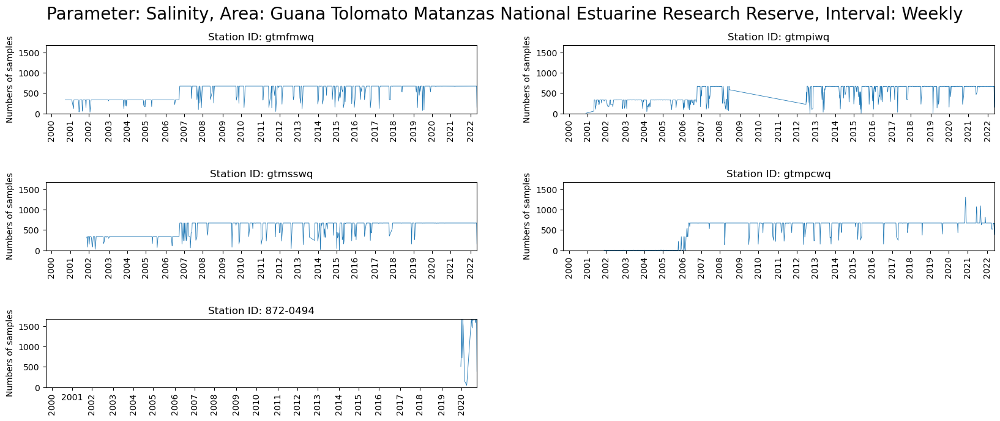

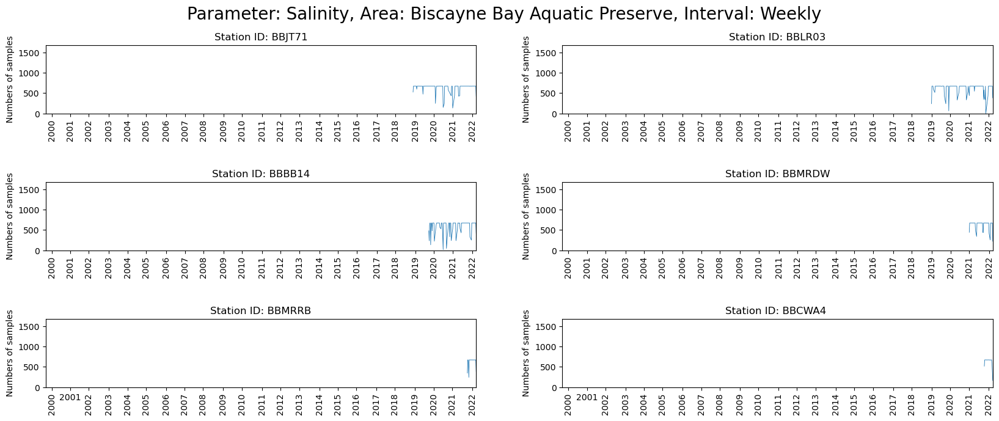

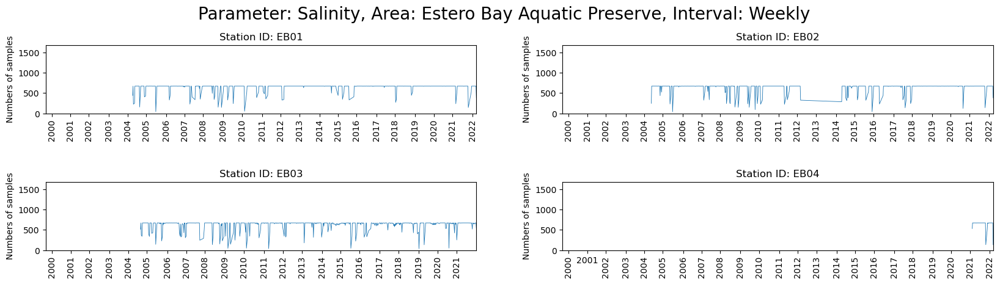

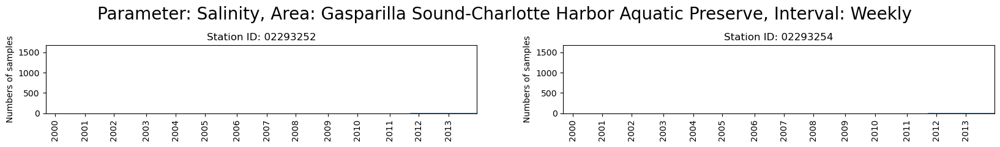

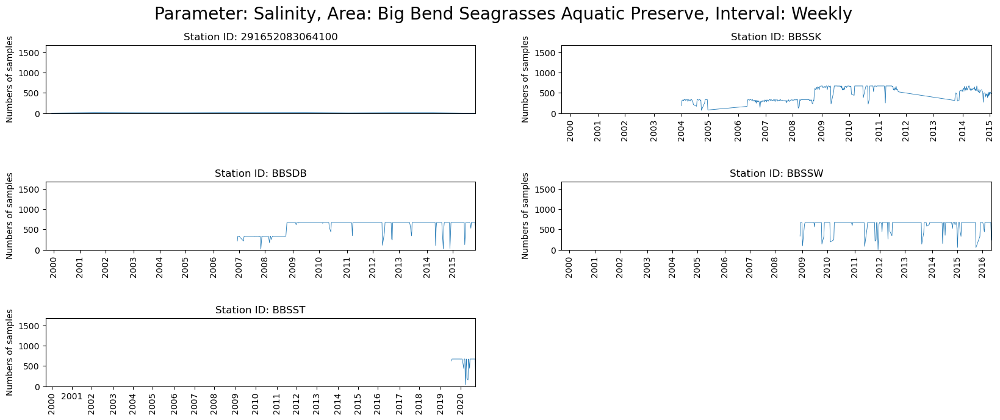

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

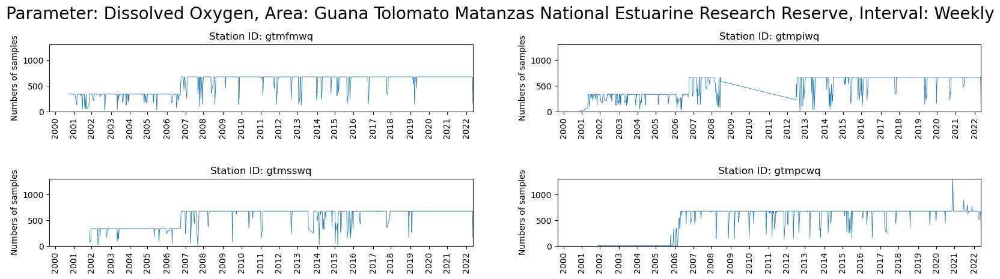

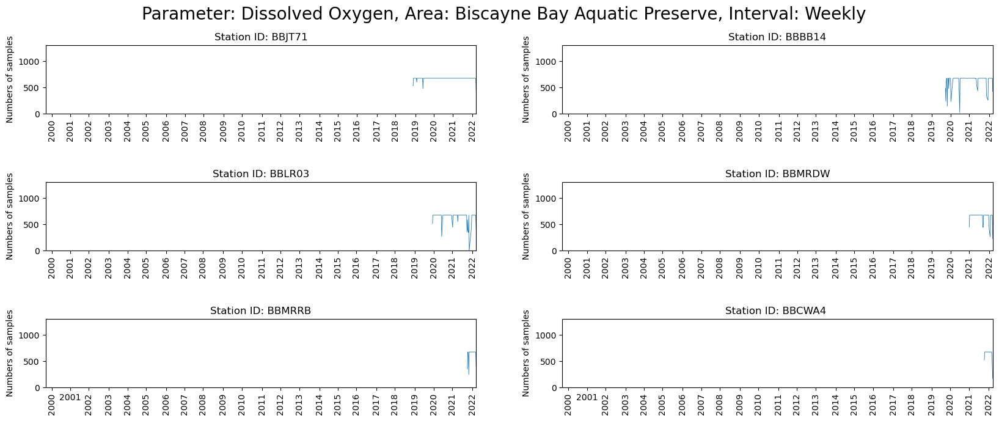

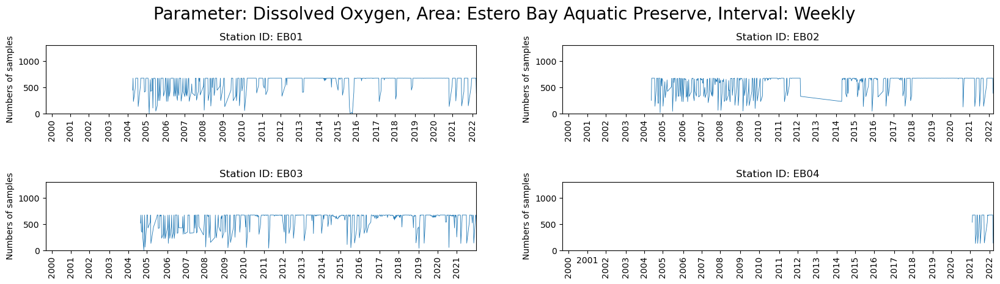

<Figure size 2000x1600 with 0 Axes>

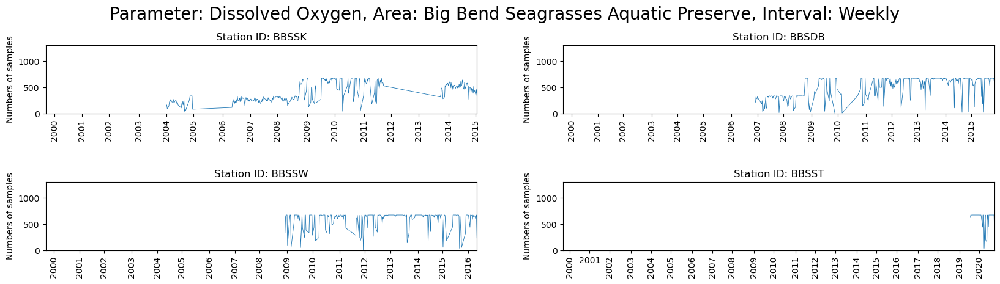

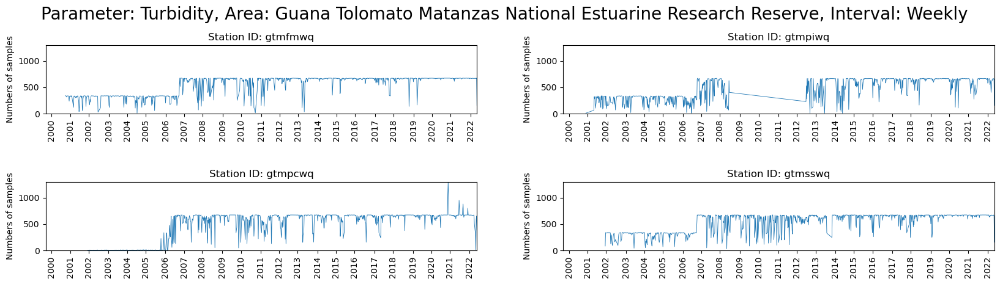

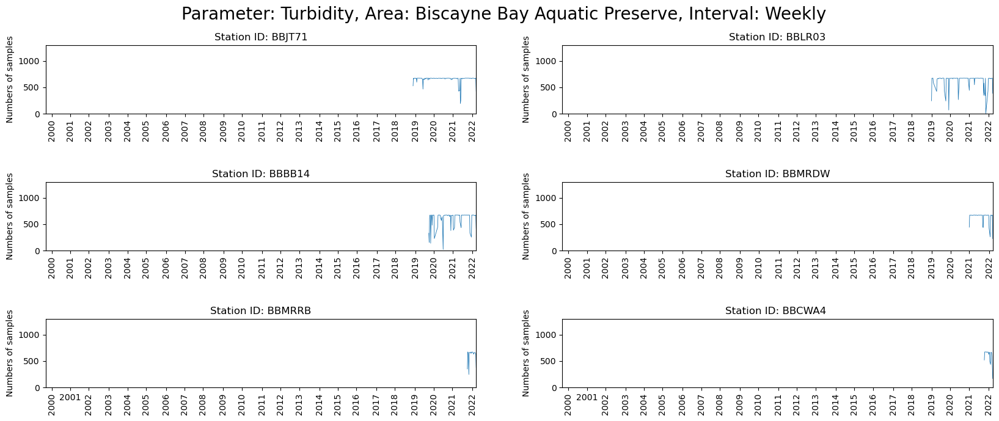

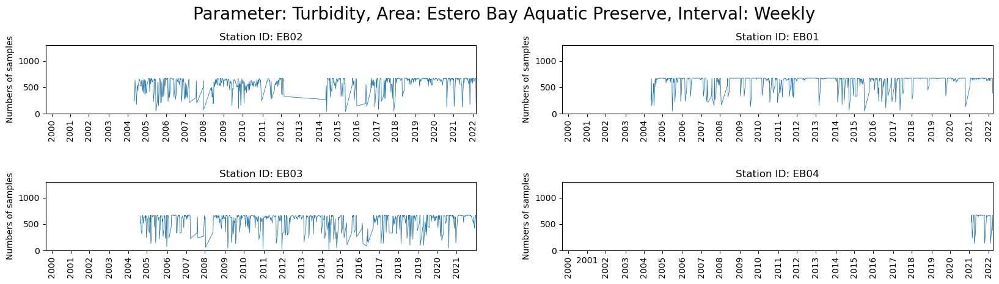

<Figure size 2000x1600 with 0 Axes>

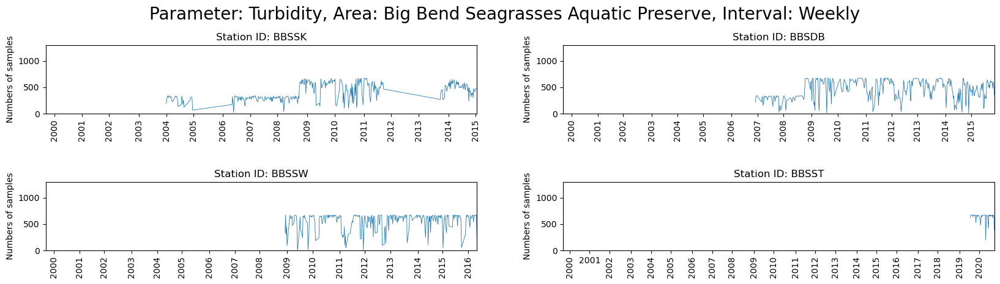

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

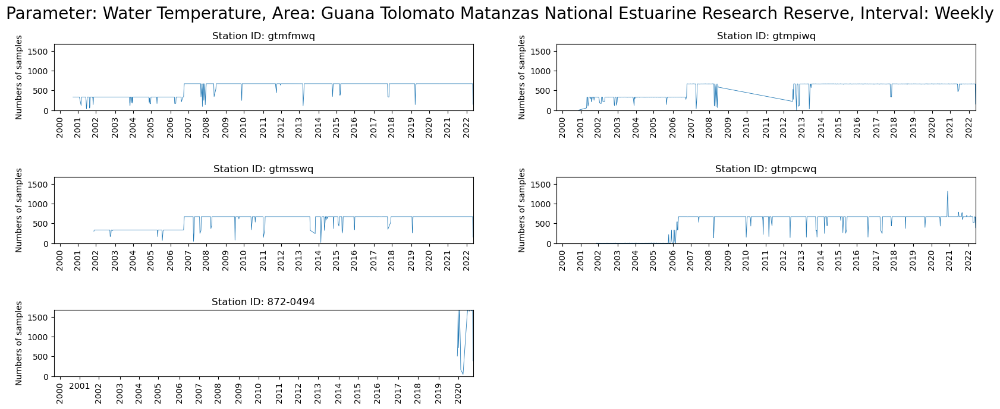

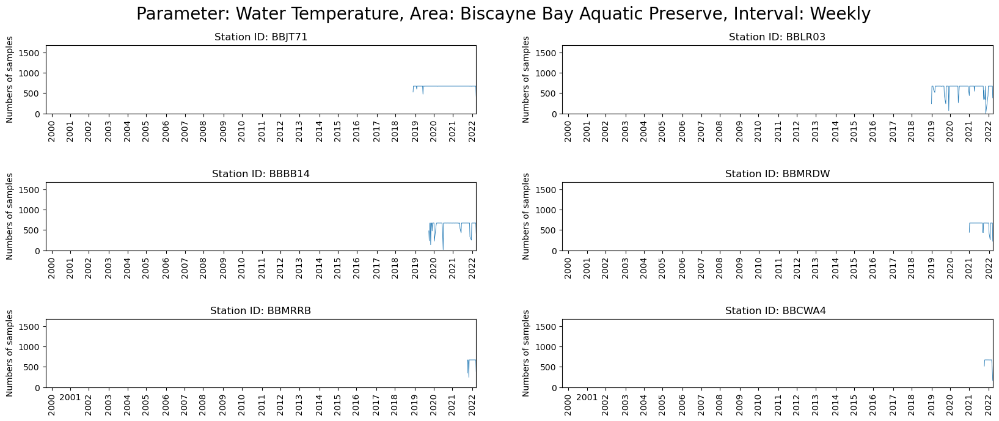

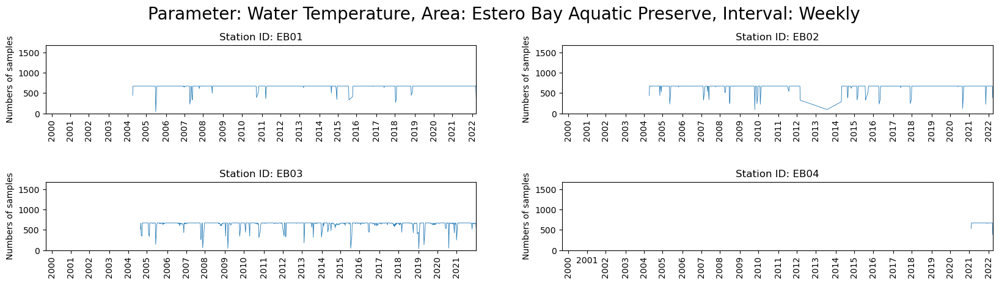

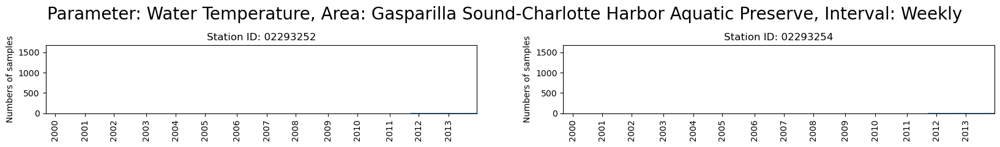

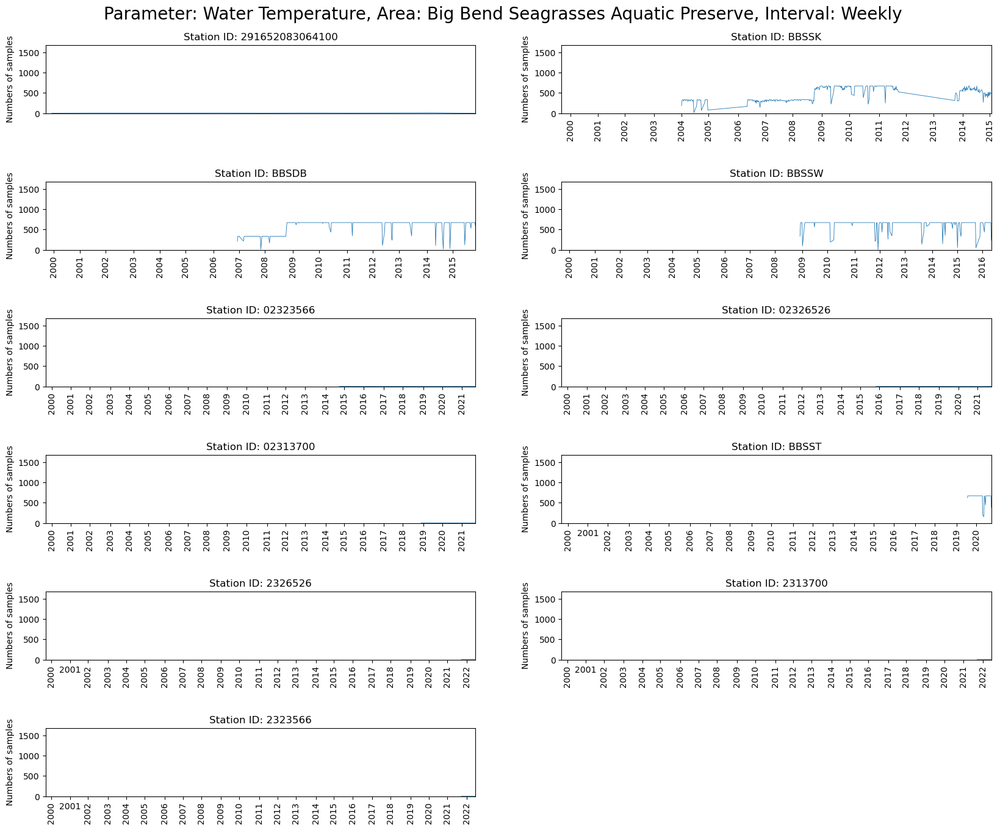

In [103]:
plt.rcParams['figure.figsize'] = [20, 16]
value = listValue[0]
rule  = rrulewrapper(YEARLY, byeaster=1, interval=1)
loc   = RRuleLocator(rule)
for para in listPara:
    for i in range(len(listArea)):
        fig = plt.figure()
        plt.suptitle("Parameter: " + para + ", "+"Area: "+ str(listArea[i])+", Interval: Weekly", fontsize = 20, y = 0.92)
        dfNew = weekly_count[(weekly_count["ParameterName"] == para)&(weekly_count["ManagedAreaName"]== listArea[i])]
        setList = dfNew.ProgramLocationID.unique()
        up_lim = weekly_count[(weekly_count["ParameterName"] == para)]['count'].max()
        for each in range(len(setList)):
            dfEachValue = dfNew[dfNew["ProgramLocationID"]==setList[each]]
            if dfEachValue["ParameterName"].count() != 0:
                ax = fig.add_subplot(6,2,each+1)
                ax.set_title("Station ID: "+str(setList[each]))
                ax.plot(dfEachValue["timestamp"],dfEachValue[str(value)],linewidth=0.6)
                ax.xaxis.set_major_locator(loc)
                plt.xticks(rotation=90)
                ax.set_xlim([pd.Timestamp('2000-01-01'),dfEachValue["timestamp"].max()])
                ax.set_ylim([0,up_lim])
                plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2,hspace=1)
                plt.ylabel("Numbers of samples")

### 2.2 Monthly Count

Create line charts for sample **counts** in monthly intervals. These line charts shows sampling activity in different time periods.

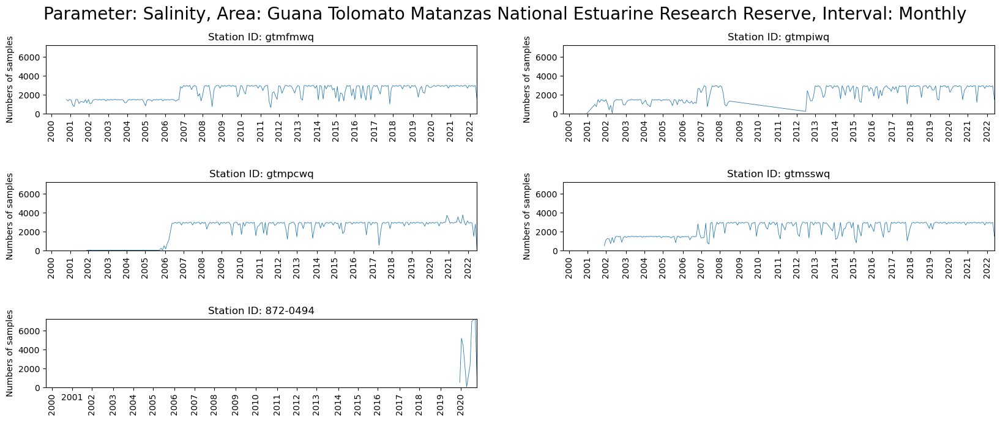

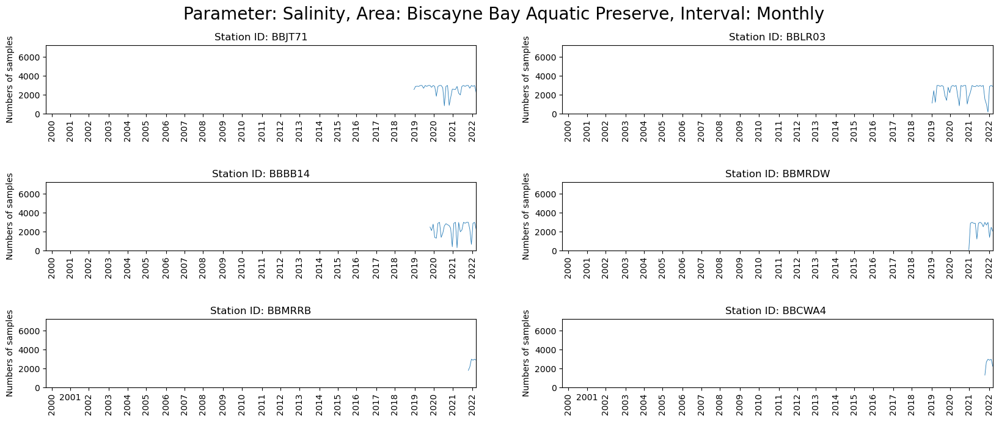

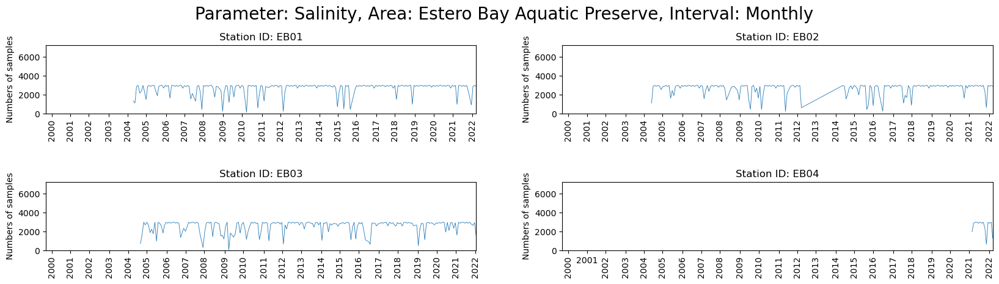

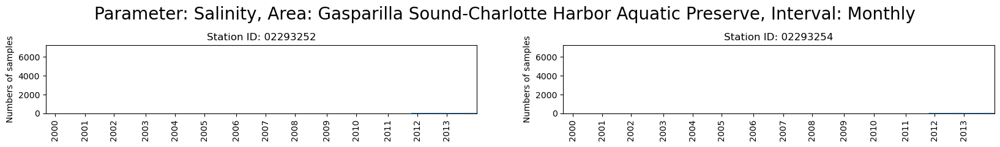

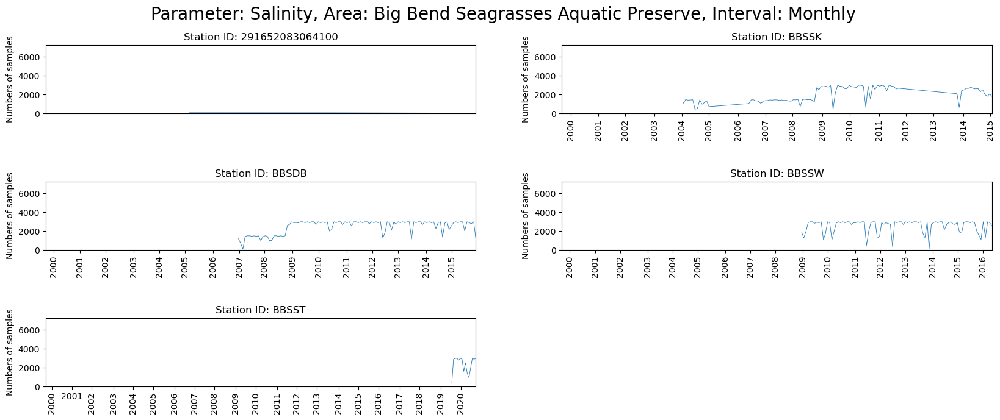

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

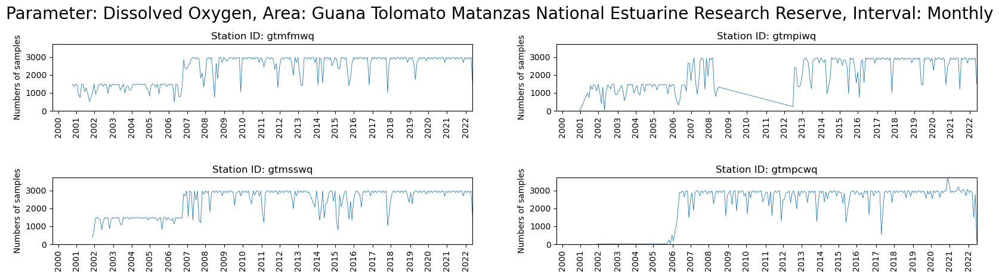

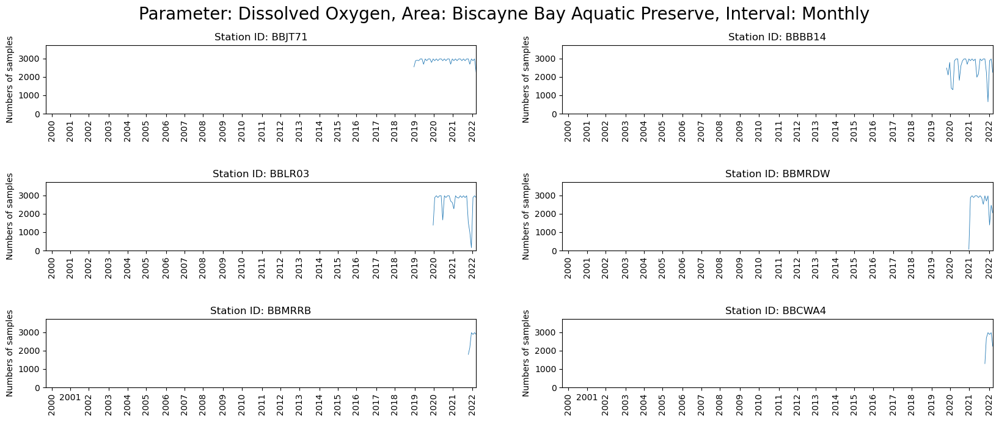

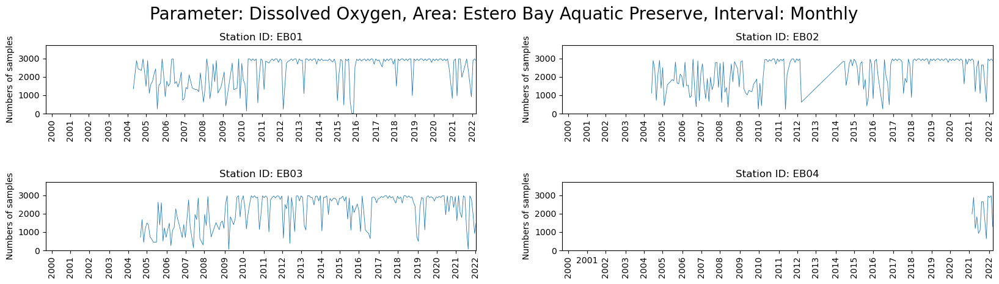

<Figure size 2000x1600 with 0 Axes>

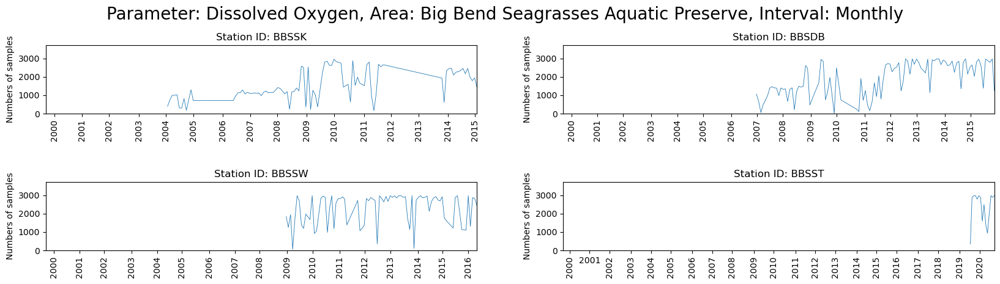

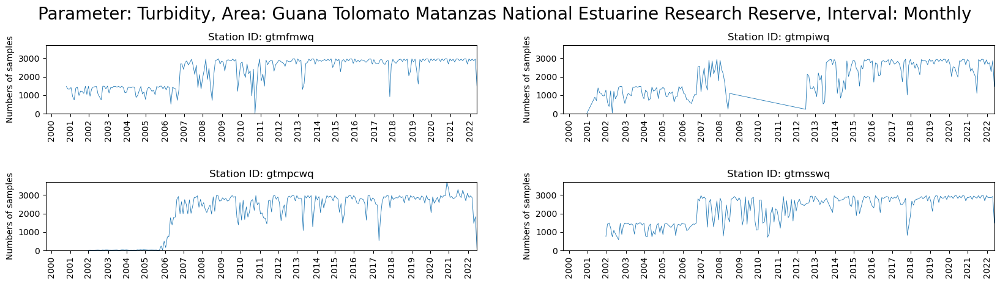

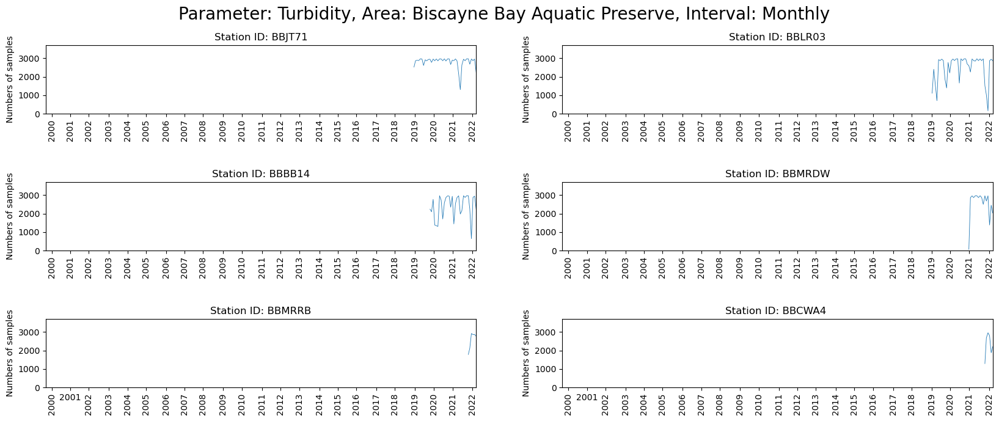

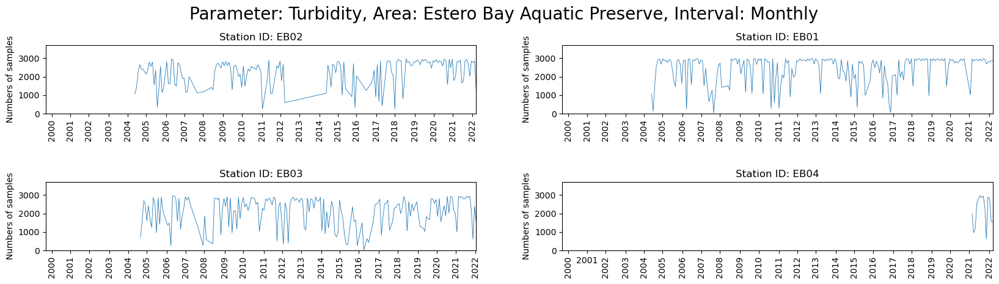

<Figure size 2000x1600 with 0 Axes>

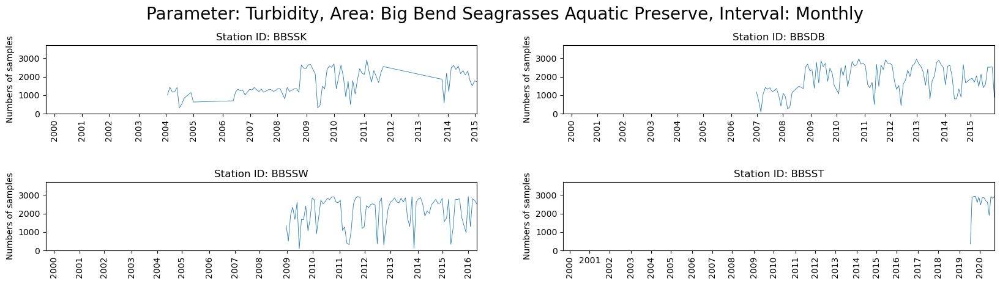

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

<Figure size 2000x1600 with 0 Axes>

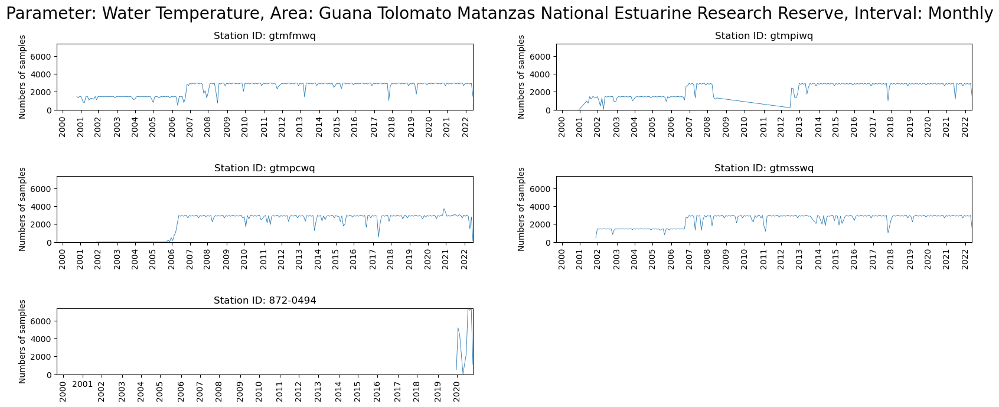

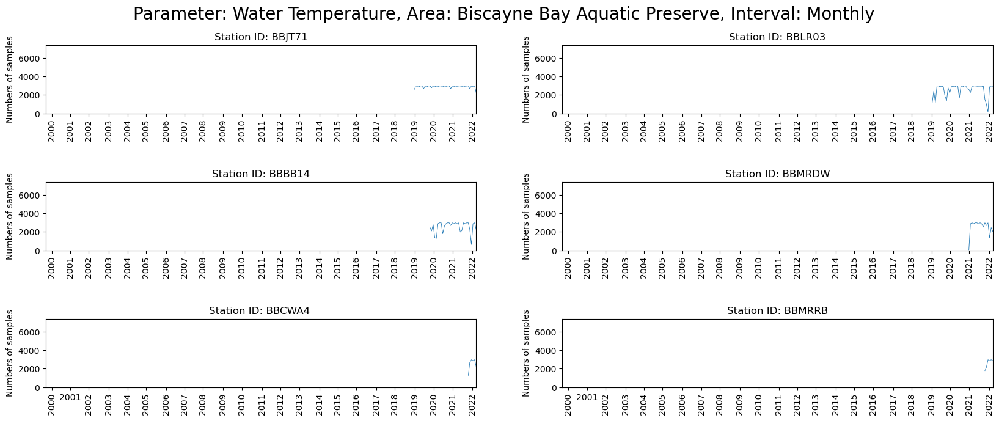

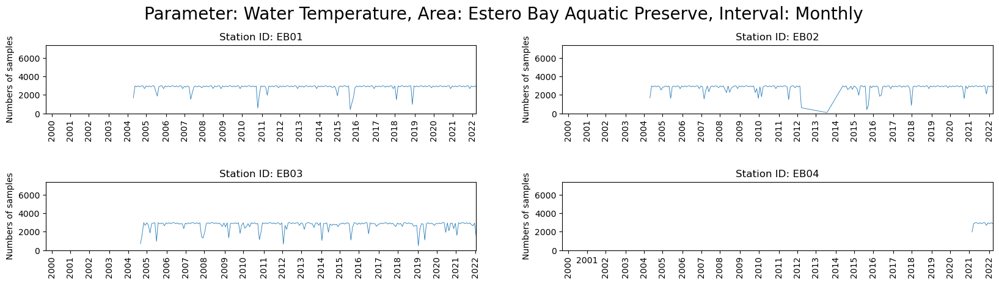

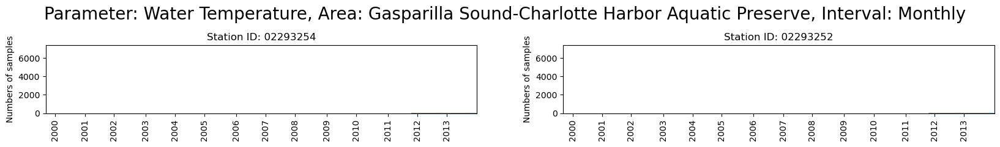

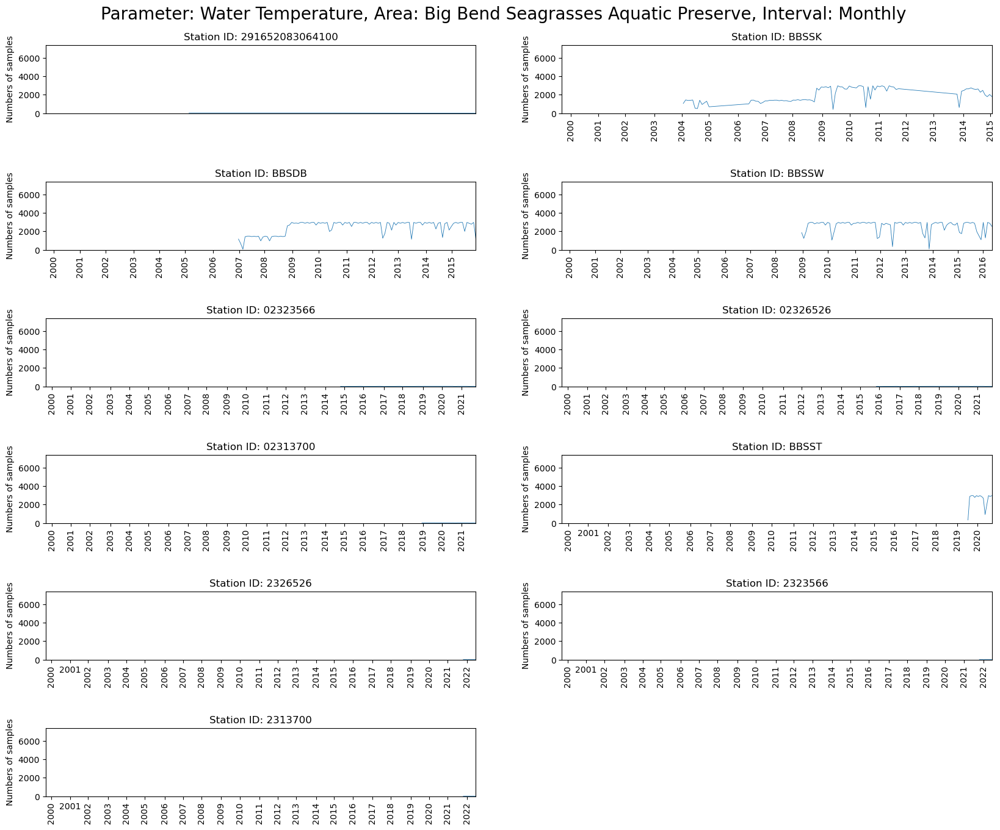

In [105]:
plt.rcParams['figure.figsize'] = [20, 16]
value = listValue[0]
rule  = rrulewrapper(YEARLY, byeaster=1, interval=1)
loc   = RRuleLocator(rule)
for para in listPara:
    for i in range(len(listArea)):
        fig = plt.figure()
        plt.suptitle("Parameter: " + para + ", "+"Area: "+ str(listArea[i])+", Interval: Monthly", fontsize = 20, y = 0.92)
        dfNew = monthly_count[(monthly_count["ParameterName"] == para)&(monthly_count["ManagedAreaName"]== listArea[i])]
        setList = dfNew.ProgramLocationID.unique()
        up_lim = monthly_count[(monthly_count["ParameterName"] == para)]['count'].max()
        for each in range(len(setList)):
            dfEachValue = dfNew[dfNew["ProgramLocationID"]==setList[each]]
            if dfEachValue["ParameterName"].count() != 0:
                ax = fig.add_subplot(6,2,each+1)
                ax.set_title("Station ID: "+str(setList[each]))
                ax.plot(dfEachValue["timestamp"],dfEachValue[str(value)],linewidth=0.6)
                ax.xaxis.set_major_locator(loc)
                plt.xticks(rotation=90)
                ax.set_xlim([pd.Timestamp('2000-01-01'),dfEachValue["timestamp"].max()])
                ax.set_ylim([0,up_lim])
                plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.2,hspace=1)
                plt.ylabel("Numbers of samples")

### 2.3 Monthly Trend

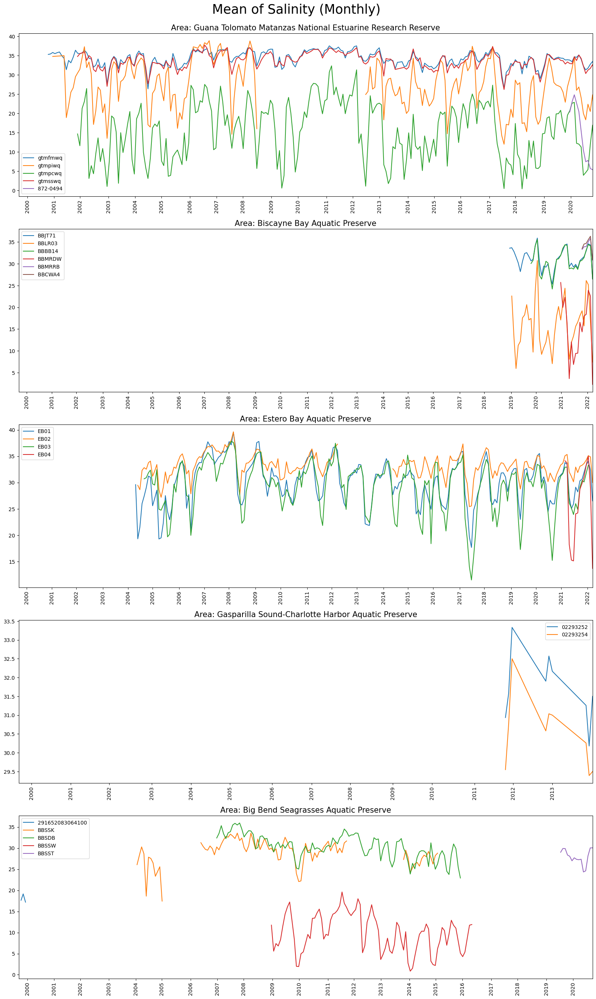

<Figure size 2000x4000 with 0 Axes>

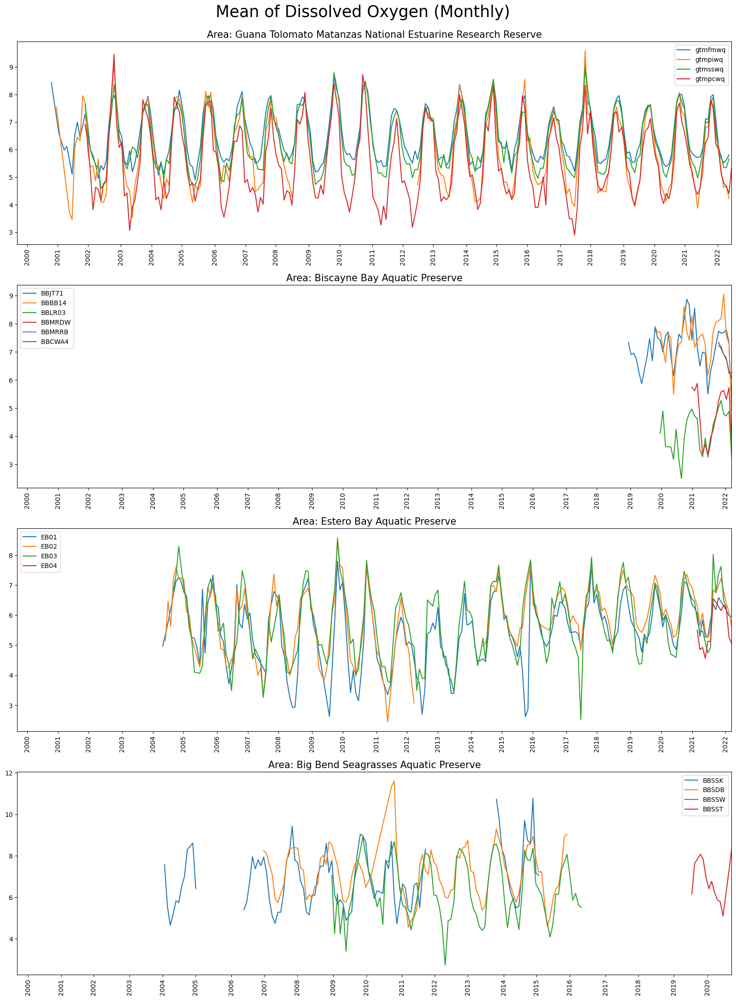

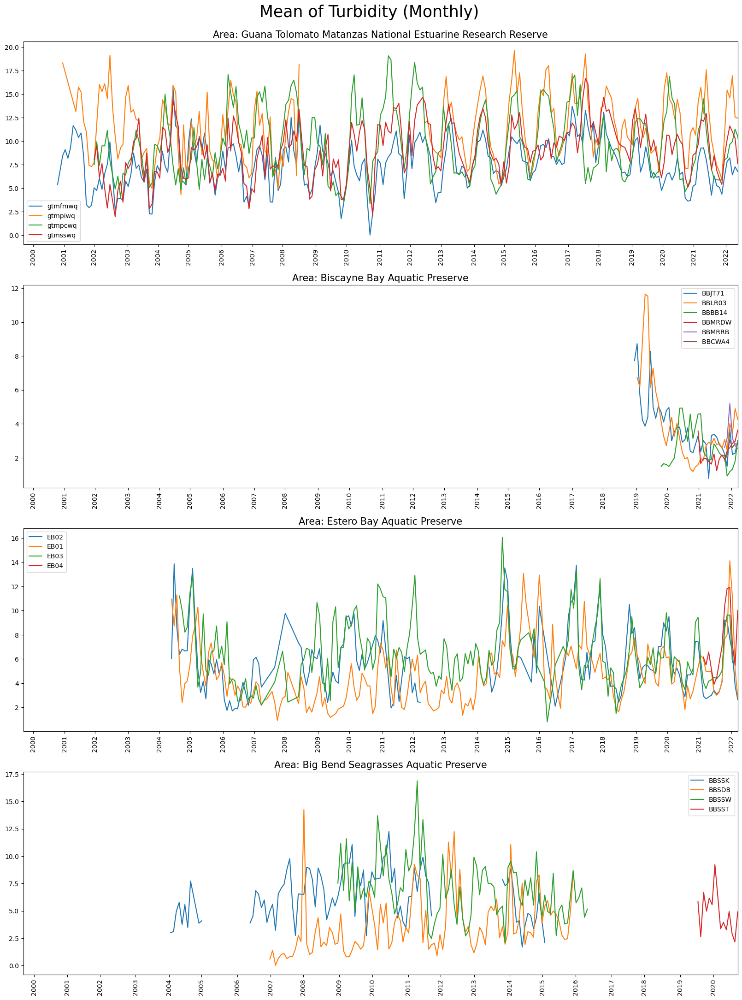

<Figure size 2000x4000 with 0 Axes>

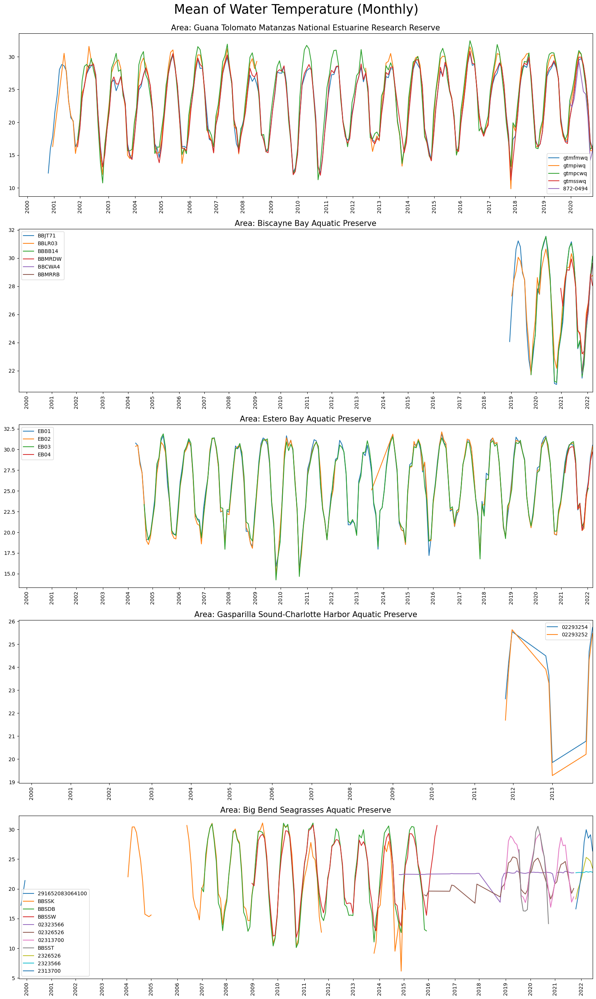

In [183]:
from datetime import datetime
plt.rcParams['figure.figsize'] = [20, 40]
value = listValue[1]
rule  = rrulewrapper(YEARLY, byeaster=1, interval=1)
loc   = RRuleLocator(rule)
for para in listPara:
    fig = plt.figure()
    plt.suptitle("Mean of {} (Monthly)".format(para), fontsize = 25, y = 0.9)
    j = 0
    for i in range(len(listArea)):
        dfNew= monthly_count[(monthly_count["ParameterName"] == para)&(monthly_count["ManagedAreaName"]== listArea[i])]
        setList = dfNew.ProgramLocationID.unique()
        if len(setList) !=0:
            ax = fig.add_subplot(6,1,j+1)
            ax.set_title('Area: '+ str(listArea[i]), size=15)
            for each in range(len(setList)):
                dfEachValue = dfNew[dfNew["ProgramLocationID"]==setList[each]]
                gap_idx = np.where(np.diff(dfEachValue.timestamp.values.astype(float)/(1000000000*3600*24*365)) > 1)[0]
                dfEachValue = pd.DataFrame(
                    columns = dfEachValue.columns, 
                    data = np.insert(dfEachValue.values, gap_idx+1, values=np.nan, axis=0)
                    )
                ax.plot(dfEachValue["timestamp"],dfEachValue[str(value)],label=setList[each])
                ax.legend(loc='best')
                ax.xaxis.set_major_locator(loc)
                plt.xticks(rotation=90)
                ax.set_xlim([pd.Timestamp('2000-01-01'),dfEachValue["timestamp"].max()])
            j = j+1

### 2.4 Yearly Trend

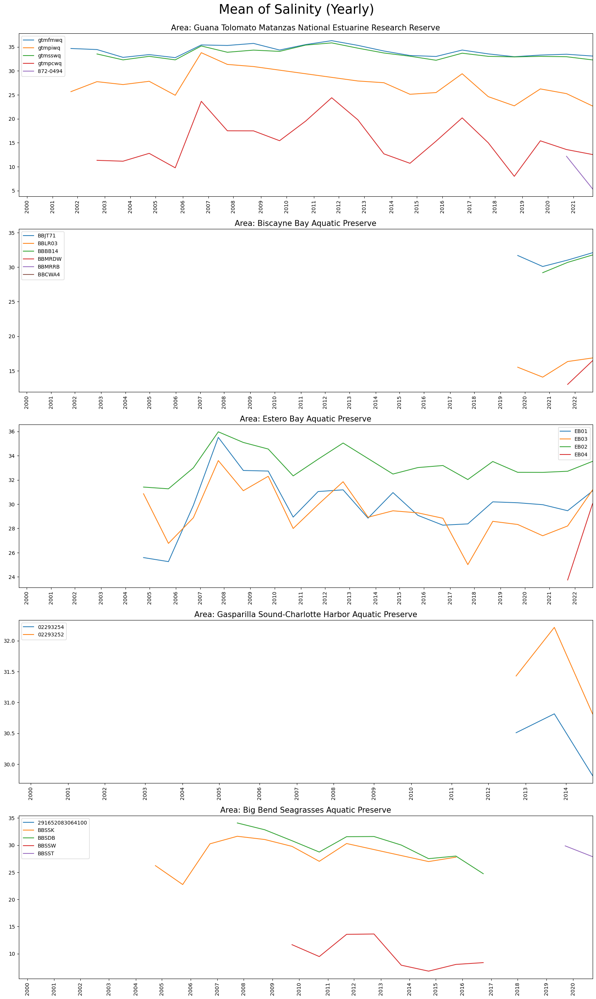

<Figure size 2000x4000 with 0 Axes>

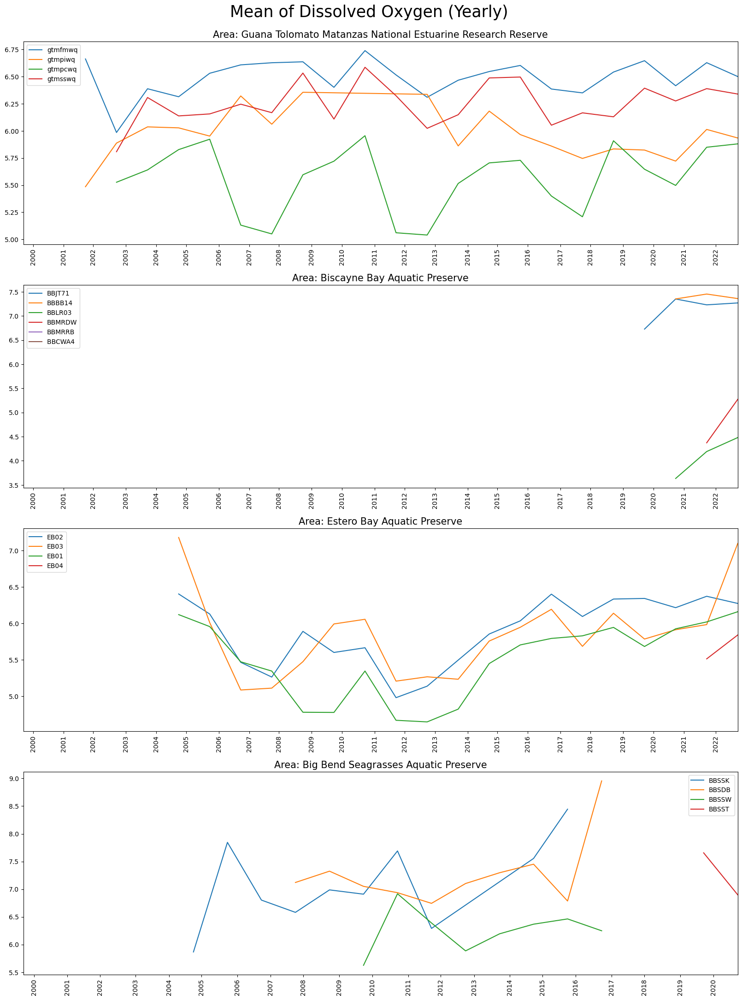

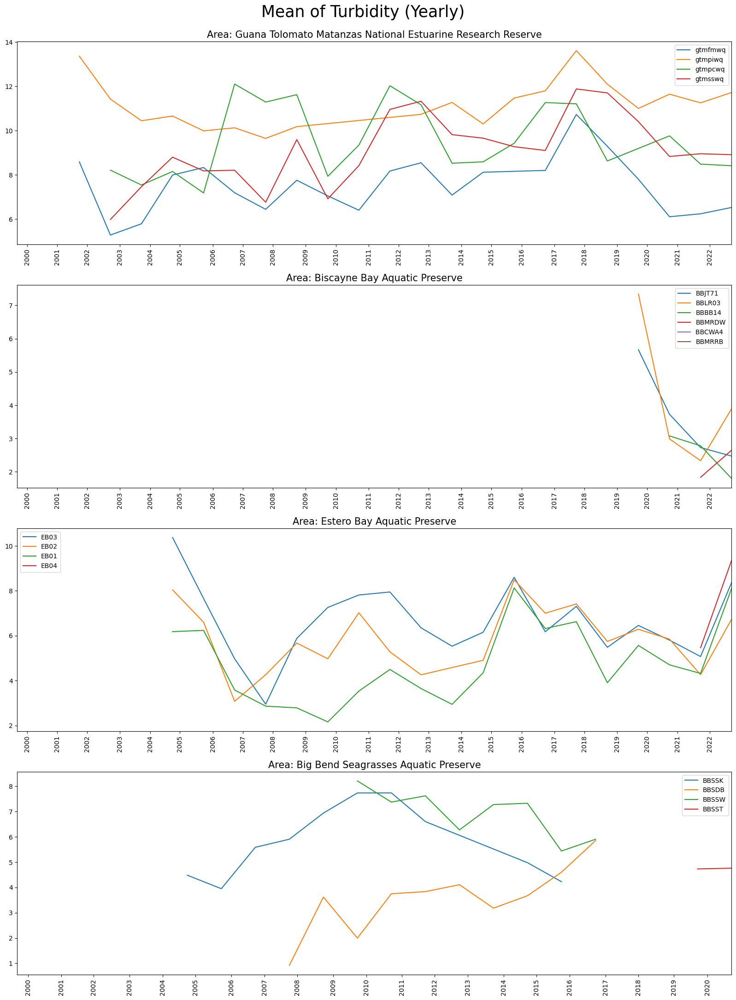

<Figure size 2000x4000 with 0 Axes>

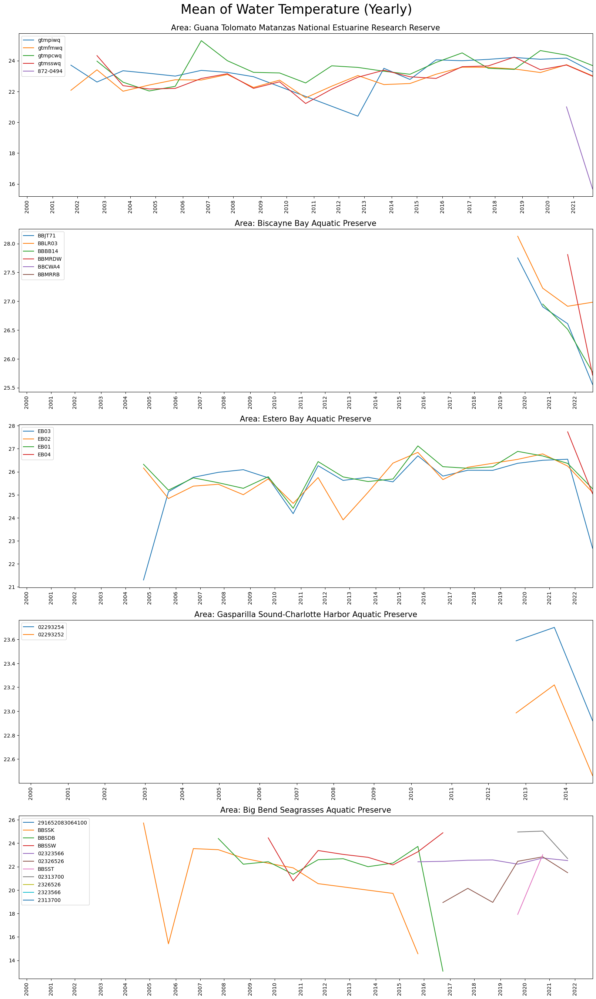

In [165]:
plt.rcParams['figure.figsize'] = [20, 40]
value = listValue[1]
rule  = rrulewrapper(YEARLY, byeaster=1, interval=1)
loc   = RRuleLocator(rule)
for para in listPara:
    fig = plt.figure()
    plt.suptitle("Mean of {} (Yearly)".format(para), fontsize = 25, y = 0.9)
    stats = yearly_count[(yearly_count["ParameterName"] == para)]
    up_lim = stats['mean']
    j = 0
    for i in range(len(listArea)):
        dfNew= yearly_count[(yearly_count["ParameterName"] == para)&(yearly_count["ManagedAreaName"]== listArea[i])]
        setList = dfNew.ProgramLocationID.unique()
        if len(setList) !=0:
            ax = fig.add_subplot(6,1,j+1)
            ax.set_title('Area: '+ str(listArea[i]), size=15)
            for each in range(len(setList)):
                dfEachValue = dfNew[dfNew["ProgramLocationID"]==setList[each]]
                ax.plot(dfEachValue["timestamp"],dfEachValue[str(value)],label=setList[each])
                ax.legend(loc='best')
                ax.xaxis.set_major_locator(loc)
                plt.xticks(rotation=90)
                ax.set_xlim([pd.Timestamp('2000-01-01'),dfEachValue["timestamp"].max()])
            j = j+1

### 2.5 Statistics by Months

The following boxplots are statistics in the same months in different years. 

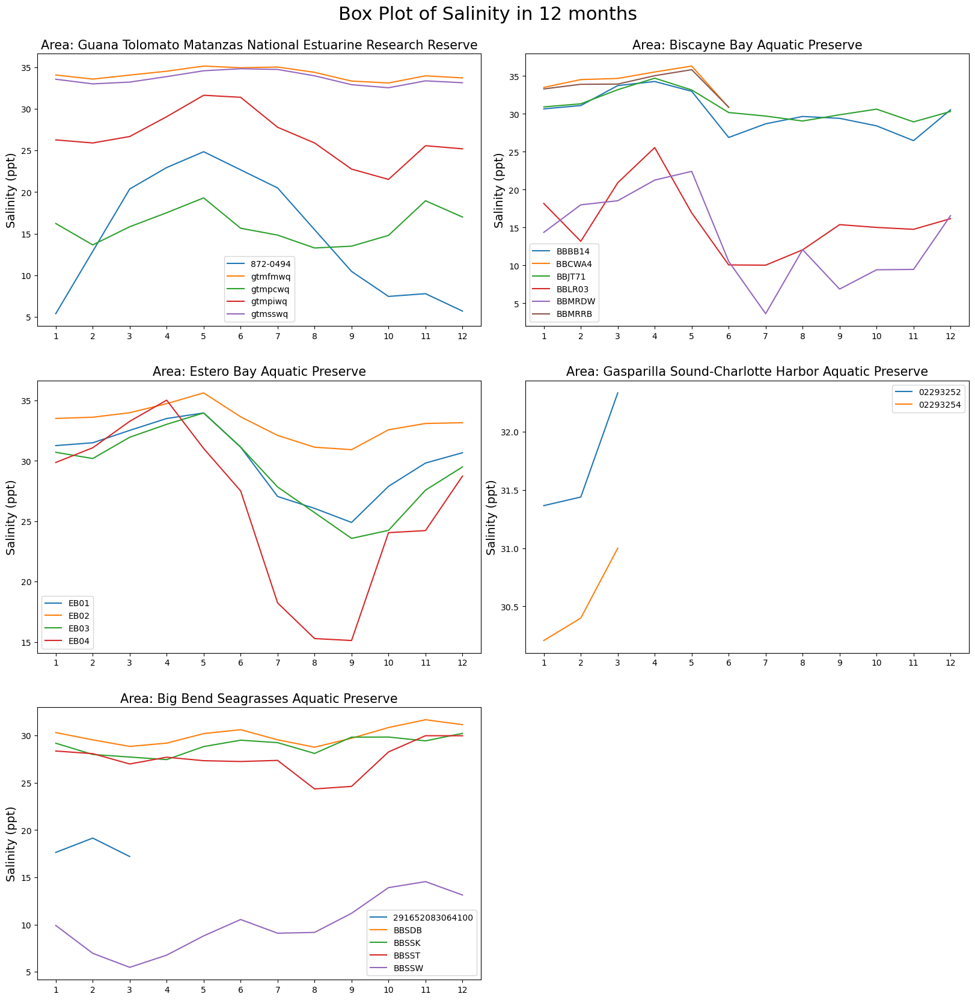

<Figure size 2000x2000 with 0 Axes>

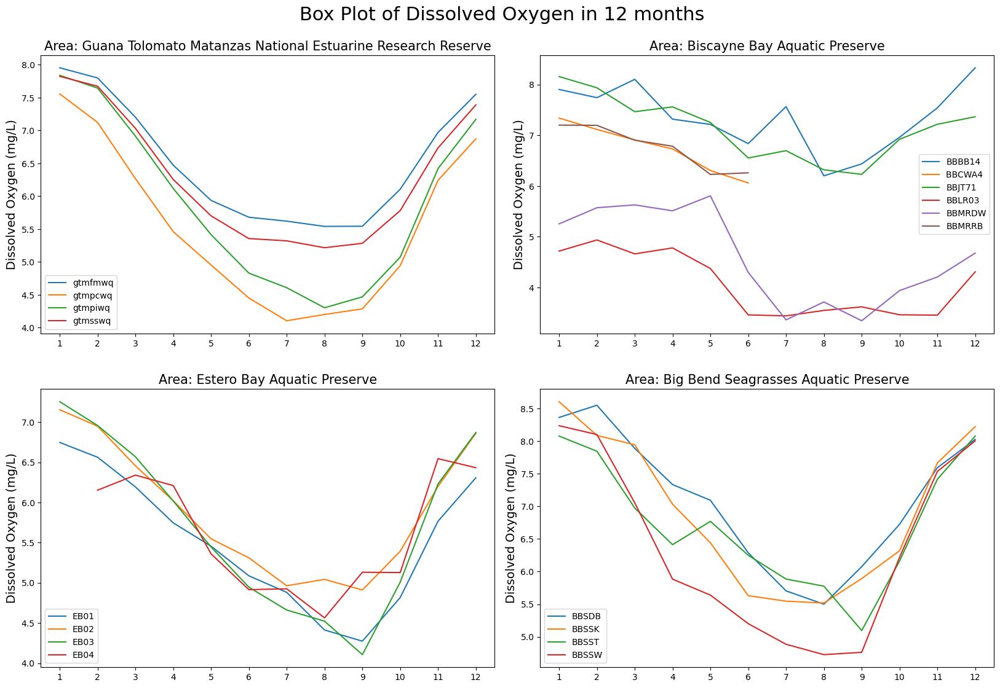

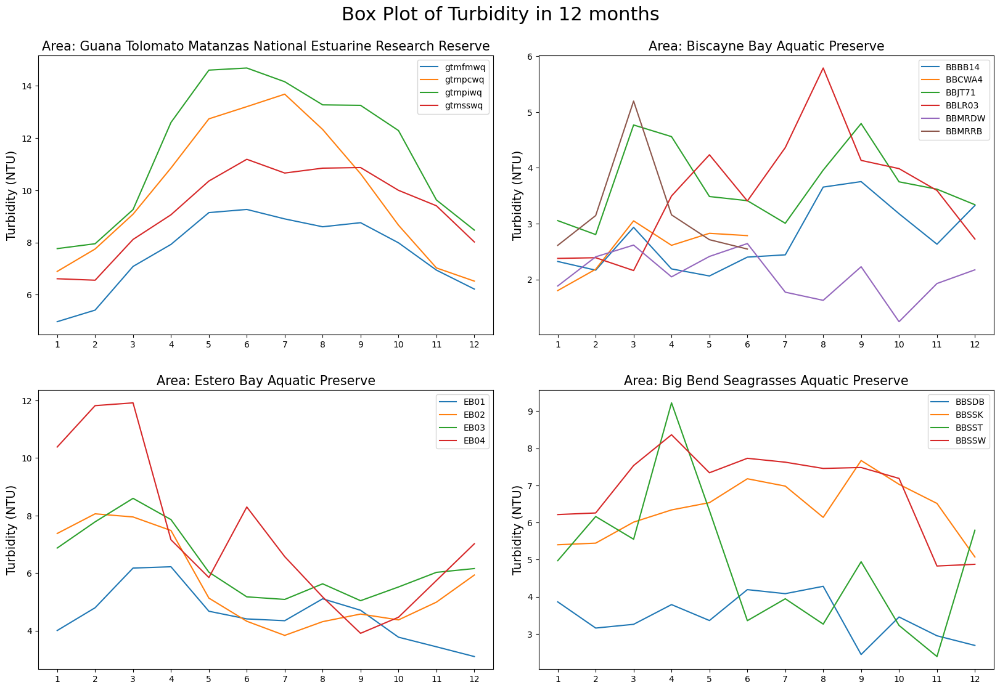

<Figure size 2000x2000 with 0 Axes>

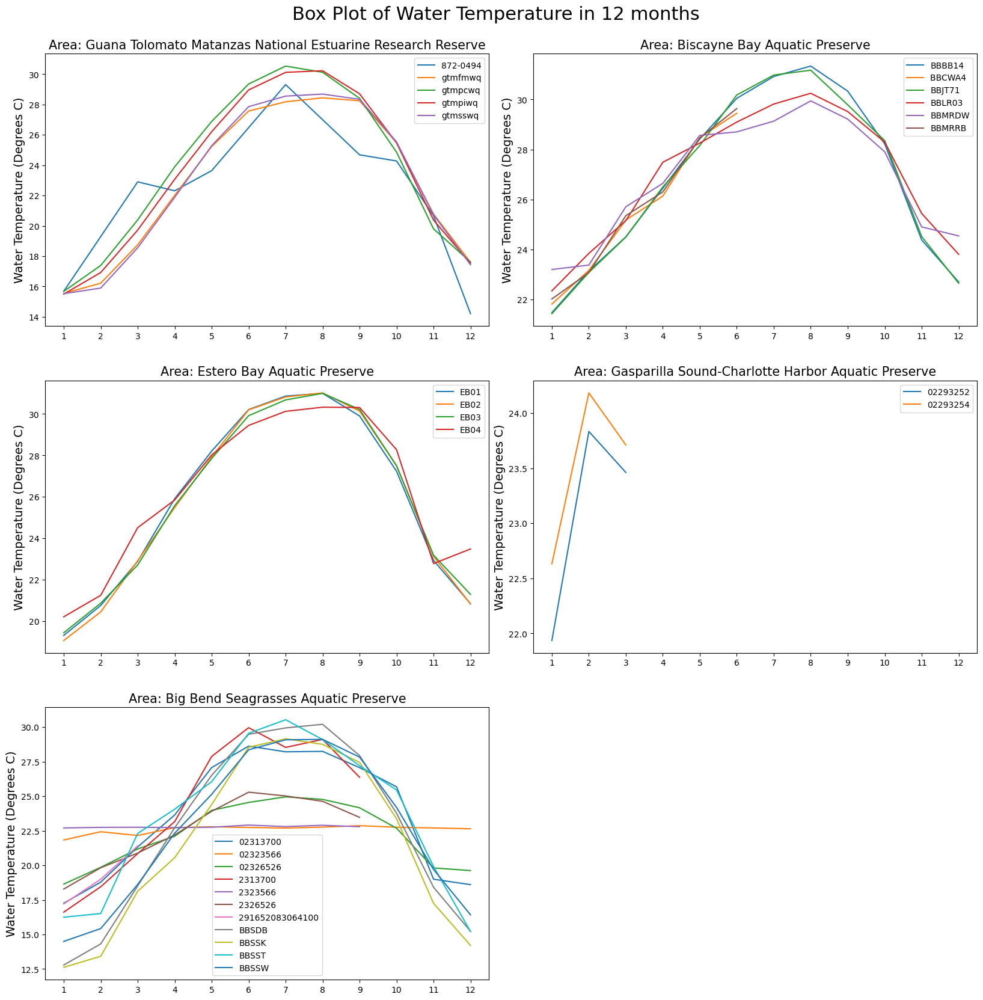

In [200]:
plt.rcParams['figure.figsize'] = [20, 20]
df3 = df2.groupby(["Month","ManagedAreaName","ParameterName","ProgramLocationID"])["ResultValue"].agg([
    "count","max","min","mean","std"]).reset_index()
x_major_locator = plt.MultipleLocator(1)
for para in listPara:
    fig = plt.figure()
    i=0
    for area in listArea:
        plt.suptitle("Box Plot of {} in 12 months".format(para), fontsize = 22, y = 0.92)
        dfNew = df3[(df3["ManagedAreaName"]==area)&(df3["ParameterName"]==para)]
        setList = dfNew.ProgramLocationID.unique()
        if len(setList) !=0:
            ax = fig.add_subplot(3,2,i+1)
            ax.set_title('Area: '+ area, size=15)
            i +=1
            for each in range(len(setList)):
                dfEachValue = dfNew[dfNew["ProgramLocationID"]==setList[each]]
                ax.plot(dfEachValue["Month"],dfEachValue["mean"],label=setList[each])
                ax.set_xlim(0.5,12.5)
                ax.legend(loc='best')
                ax.xaxis.set_major_locator(x_major_locator)
                plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.1, hspace=0.2)
                plt.ylabel("{} ({})".format(para,dictUnits[para]), size = 14)        
                ax.set_title('Area: '+ area, size=15)